# Table of Contents
- **[General info](#1)** 
- **[Longitude and latitude](#2)** 
- **[Number of panels](#3)** 
- **[Zip codes](#4)** 
- **[States](#5)** 

In [1]:
!pipenv install ydata-profiling geopandas shapely

Courtesy Notice: Pipenv found itself running within a virtual environment, so it will automatically use that environment, instead of creating its own for any project. You can set PIPENV_IGNORE_VIRTUALENVS=1 to force pipenv to ignore that environment and create its own instead. You can set PIPENV_VERBOSITY=-1 to suppress this warning.
Creating a Pipfile for this project...
Installing ydata-profiling...
Adding ydata-profiling to Pipfile's [packages]...
✔ Installation Succeeded 
Installing geopandas...
Adding geopandas to Pipfile's [packages]...
✔ Installation Succeeded 
Installing shapely...
Adding shapely to Pipfile's [packages]...
✔ Installation Succeeded 
Pipfile.lock not found, creating...
Locking [packages] dependencies...
Building requirements...
Resolving dependencies...
✔ Success! 
Locking [dev-packages] dependencies...
Updated Pipfile.lock (46761ddb4ed0ea08a51e121a54d46d744182e037c7b2f0c1911deb15a44b4efc)!
Installing dependencies from Pipfile.lock (4b4efc)...
To activate this pr

In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
import geopandas as gpd
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
from shapely.geometry import Point, Polygon
from matplotlib.patches import Rectangle

In [4]:
df = pd.read_csv('geo_solar_panels.csv')

<a name='1'></a>
# General info

Let's look at the main statistics of the dataset

In [4]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
zip_code,11509.0,4.822962e+04,3.007385e+04,603.000000,2.156000e+04,4.520500e+04,7.654400e+04,9.971200e+04
lat_max,11509.0,3.769214e+01,5.297105e+00,17.992268,3.398856e+01,3.907775e+01,4.142181e+01,6.740960e+01
lat_min,11509.0,3.760459e+01,5.303151e+00,17.956773,3.390354e+01,3.899985e+01,4.132283e+01,6.484577e+01
long_max,11509.0,-9.037189e+01,1.612587e+01,-158.051524,-9.706010e+01,-8.557844e+01,-7.833041e+01,-6.587078e+01
long_min,11509.0,-9.048235e+01,1.613767e+01,-158.129878,-9.717084e+01,-8.567318e+01,-7.846001e+01,-6.592658e+01
number_of_panels_north,11509.0,2.223962e+04,3.290437e+04,0.000000,1.716000e+03,8.496000e+03,2.899600e+04,3.638330e+05
number_of_panels_south,11509.0,8.397398e+04,8.797097e+04,0.000000,1.087700e+04,5.919500e+04,1.291060e+05,7.992280e+05
number_of_panels_east,11509.0,5.502682e+04,6.037051e+04,0.000000,6.959000e+03,3.580900e+04,8.306600e+04,5.938050e+05
number_of_panels_west,11509.0,6.626282e+04,7.394590e+04,0.000000,7.768000e+03,4.207700e+04,1.010040e+05,7.168350e+05
number_of_panels_flat,11509.0,1.683456e+05,1.969585e+05,0.000000,2.142200e+04,1.085150e+05,2.440220e+05,2.843974e+06


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11509 entries, 0 to 11508
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   zip_code                11509 non-null  int64  
 1   state                   11509 non-null  object 
 2   lat_max                 11509 non-null  float64
 3   lat_min                 11509 non-null  float64
 4   long_max                11509 non-null  float64
 5   long_min                11509 non-null  float64
 6   number_of_panels_north  11509 non-null  int64  
 7   number_of_panels_south  11509 non-null  int64  
 8   number_of_panels_east   11509 non-null  int64  
 9   number_of_panels_west   11509 non-null  int64  
 10  number_of_panels_flat   11509 non-null  int64  
 11  number_of_panels_total  11490 non-null  float64
 12  potential_kwh_total     11490 non-null  float64
dtypes: float64(6), int64(6), object(1)
memory usage: 1.1+ MB


In [6]:
profile = ProfileReport(df, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Looks like dataset is structured around the zip_code field. Each zip code has max and min latitudes and longitudes respectively. For each zip code we have a distribution of panels facing various directions and the target field that we need to predict.
We see that target and number_of_panels_total have the same number of nulls. Other columns do no have empty values.
Let's traverse the dataset fields and verify their content. For each group of columns we will make sanity check and suggest treatment at ETL stage. We will look at lattitude and longitude columns first.

<a name='2'></a>
# Longitude and latitude

For this group of columns we already know that there are no nulls and that distributions for latitude columns are close to normal, while longitude distributions are close to bimodel. To analyse outliers, let's draw boxplots.

<AxesSubplot: title={'center': 'Longitude'}>

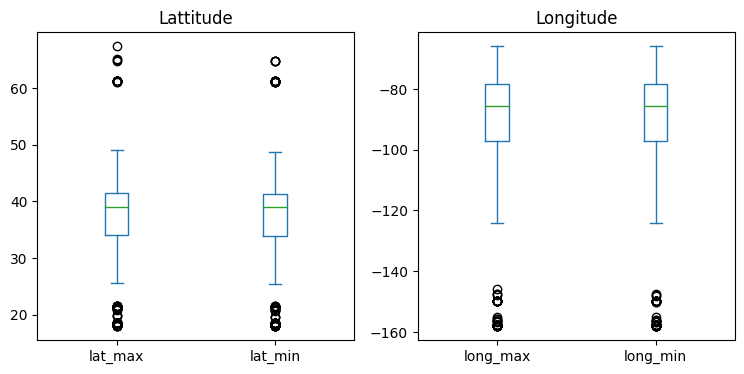

In [7]:
fig, ax = plt.subplots(1,2, figsize=[9, 4])
df[['lat_max', 'lat_min']].plot(kind='box', title='Lattitude', ax = ax[0])
df[['long_max', 'long_min']].plot(kind='box', title='Longitude', ax = ax[1])

We see that majority of zip codes are located around 40th latitude and -90 longitude. Interestingly, there are outliers here, i.e. zipcodes that are far away from the majority. We will look at geographical locations of zipcodes later on to see if those outliers are errors in data or real locations. 

Distributions of lattitudes min/max and longitudes min/max are almost identical. And indeed we can see the same in the list of statistics in the `describe` output above. Since distributions are very similar, these features might be redundant. At ETL stage it might be beneficial replace them with mean coordinates for each sip code and extract additional features, such as area of each zip code and panels density #TODO  

In [13]:
# creating mean coordinates for use in the rest of this file
df.loc[:, 'lat_mean'] = (df['lat_max'] + df['lat_min']) / 2
df.loc[:, 'long_mean'] = (df['long_max'] + df['long_min']) / 2

<a name='3'></a>
# Number of panels

Let's look at the number of panels columns. We've seen above that all panel columns are heavily right-skewed and cuddle 0. Let's look closer at distributions with various upper limit of values to understand the distribution a bit better.

In [5]:
panel_cols = ['number_of_panels_north', 'number_of_panels_south', 'number_of_panels_east', 
            'number_of_panels_west', 'number_of_panels_flat', 'number_of_panels_total']

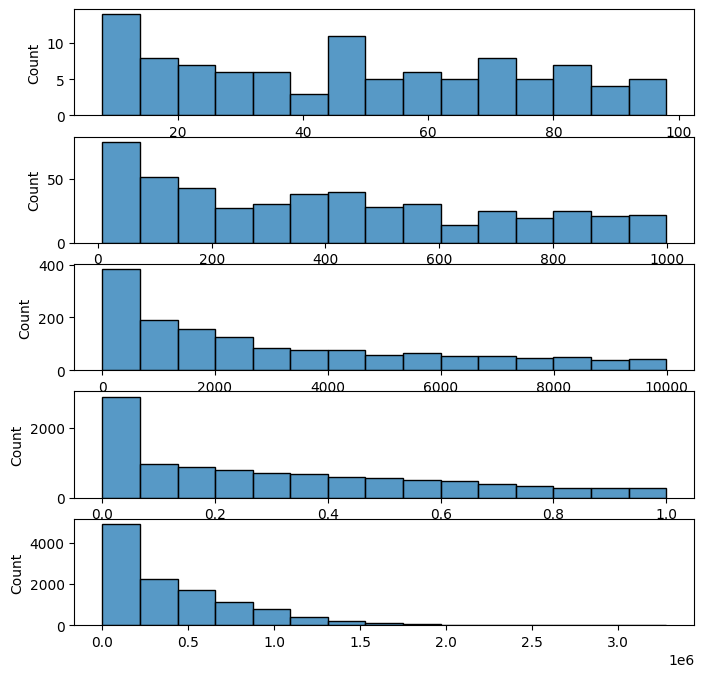

In [6]:
fig, ax = plt.subplots(5, 1, figsize = (8, 8))
for lim, ax_num in zip([1e2,1e3,1e4,1e6, 1e8], [0,1,2,3,4]):
    sns.histplot(df[df[panel_cols[-1]]<lim][panel_cols[-1]].values, bins = 15, ax=ax[ax_num])

We see that there is a long right tail, so about half of zip codes with number of panels under 250 000 are offset in terms of mean by other half with greater numbers of panels

Let's take a look now at proportions of various panels and their boxplots. We will use log scale for boxplots because of heavy skewness.

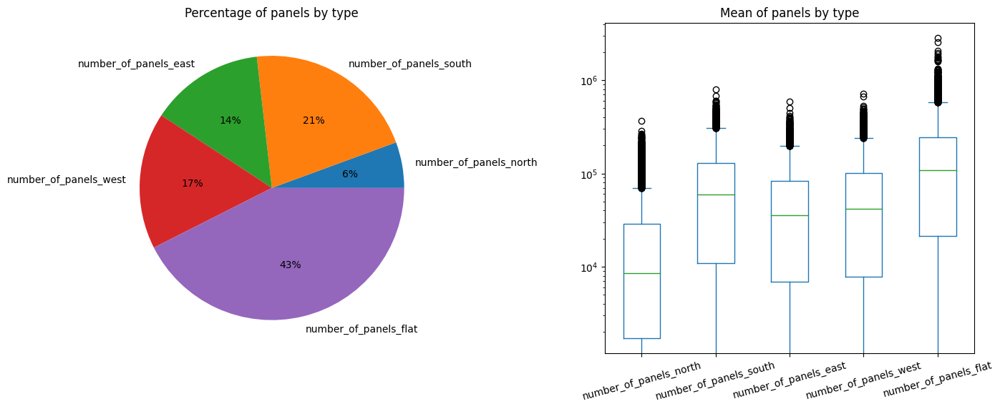

In [10]:
pie_df = df[panel_cols].copy()
abs_pie_data = pie_df.sum().values
norm_pie_data = [round((el*100) / abs_pie_data[-1], 1) for el in abs_pie_data[:-1]]

fig, ax = plt.subplots(1, 2, figsize=[16, 6])
ax[0].pie(norm_pie_data, labels=panel_cols[:-1], autopct='%1.f%%')
ax[0].set_title('Percentage of panels by type')

df[['number_of_panels_north', 'number_of_panels_south',	
    'number_of_panels_east', 'number_of_panels_west', 'number_of_panels_flat']
    ].plot(kind='box', title='mean_panels_by_type', logy=True, rot=15, ax=ax[1])
ax[1].set_title('Mean of panels by type')

fig.subplots_adjust(hspace=0, wspace=0.4)

Ok, so we see that majority of panels are flat, both on average and in total. As before on histrograms, we see long right tails in distributions on boxplots. As a sanity check, let's check that all panel columns sum to total.

In [11]:
(df[panel_cols[:-1]].sum(axis=1)!=df[panel_cols[-1]]).sum()

19

Interesting, so there are 19 rows, where panel columns do not sum to total. Let's see what they are. Let's add target column as well.

In [12]:
df[df[panel_cols[:-1]].sum(axis=1)!=df[panel_cols[-1]]][panel_cols+['potential_kwh_total']]

,number_of_panels_north,number_of_panels_south,number_of_panels_east,number_of_panels_west,number_of_panels_flat,number_of_panels_total,potential_kwh_total
491,0,0,0,0,0,NaN,NaN
492,0,0,0,0,0,NaN,NaN
1074,0,0,0,0,0,NaN,NaN
1185,0,0,0,0,0,NaN,NaN
3589,0,0,0,0,0,NaN,NaN
4394,0,0,0,0,0,NaN,NaN
4395,0,0,0,0,0,NaN,NaN
4857,0,0,0,0,0,NaN,NaN
5134,0,0,0,0,0,NaN,NaN
5504,0,0,0,0,0,NaN,NaN


Ok, so there are 19 rows where number of panels cols along with target are not populated. These are the same 19 records with nulls we've seen in the general info section. Since there are only 19 records with nulls, we will simply drop them at the ETL stage. #TODO

Let's now try to explore possible relation between geographical position and number of panels facing various directions. From the "business" standpoint, this might make sense. Let's check pairwise relations of these features first.

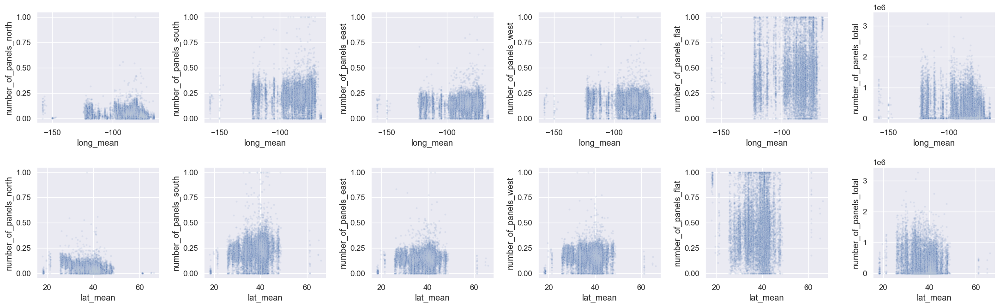

In [55]:
panels_df = df.copy()
# here we normalise panels quantity of particular type by total quantity
panels_df.loc[:, panel_cols[:-1]] = panels_df[panel_cols[:-1]].div(panels_df['number_of_panels_total'], axis=0)

coords_cols = ['long_mean', 'lat_mean']
fig, ax = plt.subplots(len(coords_cols), len(panel_cols), figsize=[22, 7])
for i, i_col in enumerate(coords_cols):
    for j, j_col in enumerate(panel_cols):
        sns.scatterplot(data=panels_df.sort_values(i_col), x=i_col, y=j_col, alpha=.1, marker='.', ax=ax[i, j])        
sns.set(font_scale=1.5)
fig.tight_layout()

We see that it's hard to pinpoint any particular relations between particular type of panels and coordinates. One could probably note that there are less panels in higher latitudes and lower longitudes. 

Let's check another hypothesis on relation of volume of particular type of panels and the label featrue. For the northern hemishpere panels are usually recomended to be installed facing south. Let's check if proportion of south facing panels have any relation with the target. We will again normalise by total number of panels here.

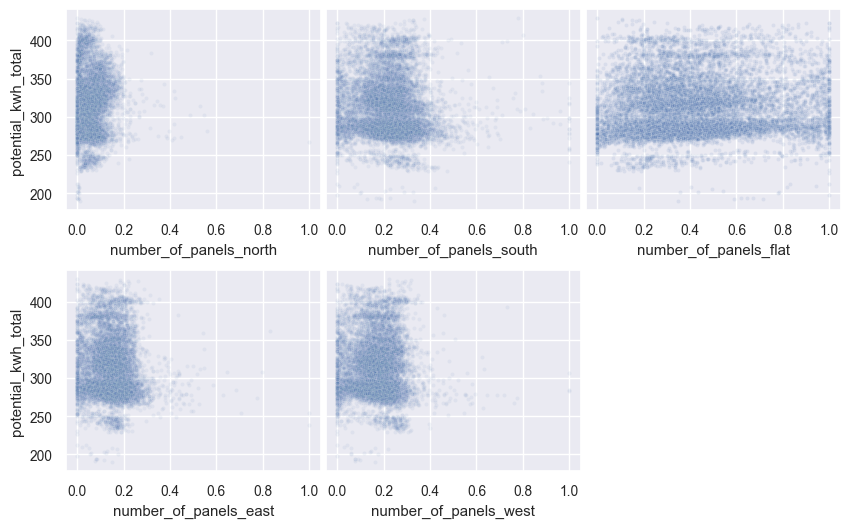

In [71]:
fig, ax = plt.subplots(2, 3, figsize=(10, 6), sharey=True)
for n, col in enumerate(panel_cols[:-2]):
    sns.scatterplot(df, x=df[col] / df[panel_cols[-1]], y=df['potential_kwh_total']/ df[panel_cols[-1]], 
                    ax=ax[n//2, n%2], marker='.', alpha=.07)
    ax[n//2, n%2].set_xlabel(col)

sns.scatterplot(df, x=df[panel_cols[-2]] / df[panel_cols[-1]], 
                    y=df['potential_kwh_total']/ df[panel_cols[-1]], 
                    ax=ax[0, 2], marker='.', alpha=.1)

ax[0, 2].set_xlabel(panel_cols[-2]); ax[0, 0].set_ylabel('potential_kwh_total'); ax[1, 0].set_ylabel('potential_kwh_total')
fig.subplots_adjust(hspace=0.3, wspace=0.02)
fig.delaxes(ax[1, 2])

As evident from the plots above, number of specific types of panels does not drive the change in the label. Additionally, as we've seen in the initial EDA report above, these columns naturally correlate with each other. For these reasons, these features are unlikely to be important for the prediction model. Further on we will look at total numbers of panels without breaking them up into subtypes.

Let's continue looking into geo distribution of panels now.

 We've seen before that there is clear majority of zipcodes relative to longitude/latitude and several outliers. Let's see if panels within that majority are uniformly distributed geographically, or perhaps some regions are more densily populated. We will use heatmap for that. Let's draw geo distribution of label next to it as well.

Text(0.5, 1.0, 'potential_kwh_total')

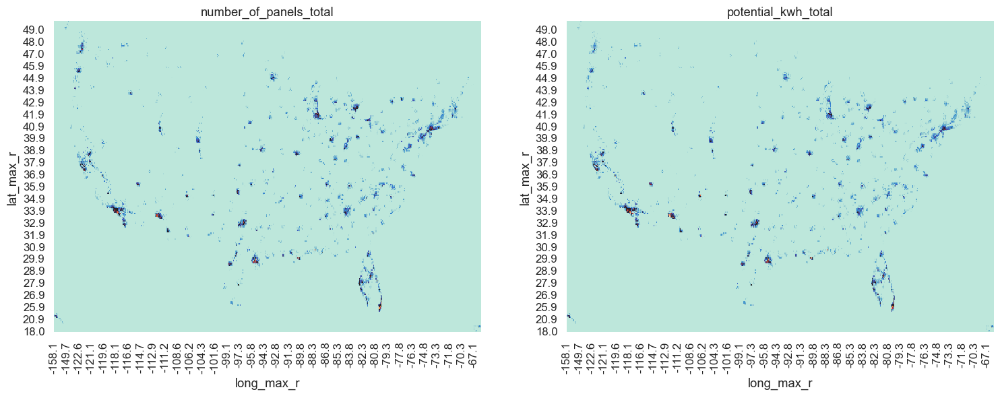

In [636]:
agg_df = df.loc[:, ['long_max', 'lat_max', 'number_of_panels_total', 
                    'number_of_panels_west', 'number_of_panels_east',
                    'number_of_panels_north', 'number_of_panels_south',
                    'potential_kwh_total']].copy()

agg_df.loc[:, 'long_max_r'], agg_df.loc[:, 'lat_max_r'] = agg_df['long_max'].round(1), agg_df['lat_max'].round(1)

agg_df = agg_df.groupby(['long_max_r', 'lat_max_r'])[['number_of_panels_total', 
                                                      'number_of_panels_west', 'number_of_panels_east', 
                                                      'number_of_panels_north', 'number_of_panels_south','potential_kwh_total']].sum().reset_index()

fig, ax = plt.subplots(1,2, figsize=[18, 6])
sns.heatmap(agg_df.pivot(index='lat_max_r', columns='long_max_r', values='number_of_panels_total').fillna(0), cmap='icefire', cbar=False, ax=ax[0])
sns.heatmap(agg_df.pivot(index='lat_max_r', columns='long_max_r', values='potential_kwh_total').fillna(0), cmap='icefire', cbar=False, ax=ax[1])
ax[0].invert_yaxis(); ax[1].invert_yaxis()
ax[0].set_title('number_of_panels_total'); ax[1].set_title('potential_kwh_total')

Indeed we see that there are very pronounced regions of panels concentration. Hence, geographic position should have big impact on the label we are predicting. Moreover, heatmap for the label is almost identical. It's important to note, that groups of points match between the two graphs simply due to the structure of the dataset. Heatmap color gradients are similar, but it's hard to be sure looking at these plots. Let's explicitly draw the relation between the two features to confirm.

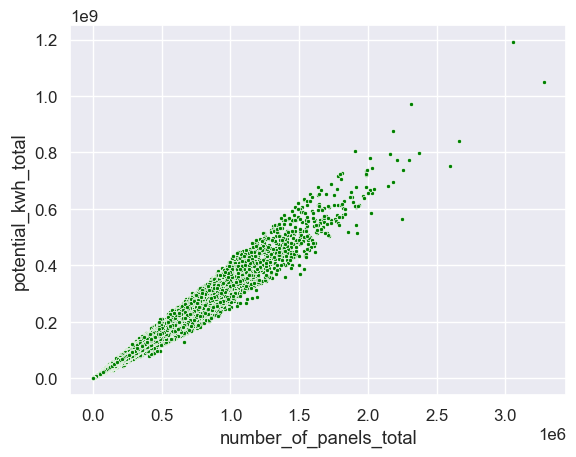

In [707]:
sns.scatterplot(df, x=df['number_of_panels_total'], y=df['potential_kwh_total'], marker='.', color='green');

We see the confirmation. Indeed, two features dynamics are clearly related. At the modeling phase, linear model based on this one feature will be the baseline. We will see if improving it is possible. #TODO

<a name='4'></a>
# Zip codes

[Text(0.5, 0, '')]

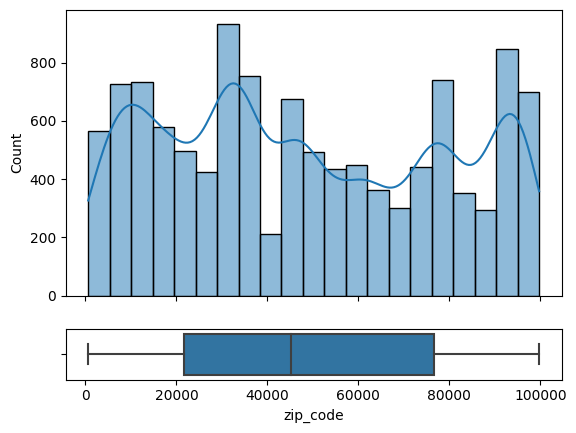

In [67]:
fig, ax = plt.subplots(2, 1, sharex=True, gridspec_kw={"height_ratios": (.85, .15)})

sns.boxplot(df, x="zip_code", ax=ax[1], orient='h')
sns.histplot(df, x="zip_code", ax=ax[0], kde=True)
ax[0].set(xlabel='')

We have already seen that zip codes are close to be uniformly distributed, no outliers. Nearly uniform distribution makes sense, given the structure of the dataset. Let's do the sanity check and verify that values actually logically tied to lattitude or longitude, as they should be. We will use a heatmap plot for it again.


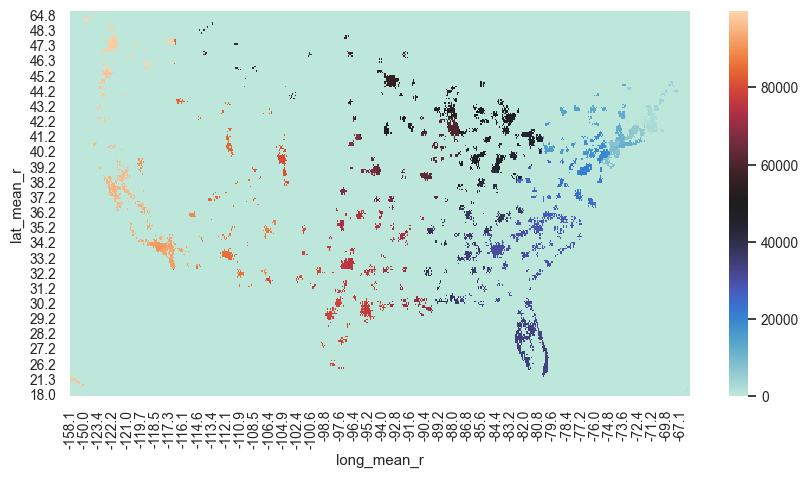

In [73]:
zip_df = df.loc[:, ['long_mean', 'lat_mean', 'zip_code']].copy()
zip_df.loc[:, 'long_mean_r'], zip_df.loc[:, 'lat_mean_r'] = zip_df['long_mean'].round(1), zip_df['lat_mean'].round(1)

zip_df = zip_df.groupby(['long_mean_r', 'lat_mean_r'])[['zip_code']].max().reset_index()
plt.figure(figsize=(10,5))
sns.heatmap(zip_df.pivot(index='lat_mean_r', columns='long_mean_r', values='zip_code').fillna(0), cmap='icefire', cbar=True)
plt.gca().invert_yaxis()

We see that zipcodes on a large scale indeed increase with the change in longitude. Let's randomly select one area and examine dynamics on smaller scale. 

<AxesSubplot: xlabel='lat_mean_r', ylabel='long_mean_r'>

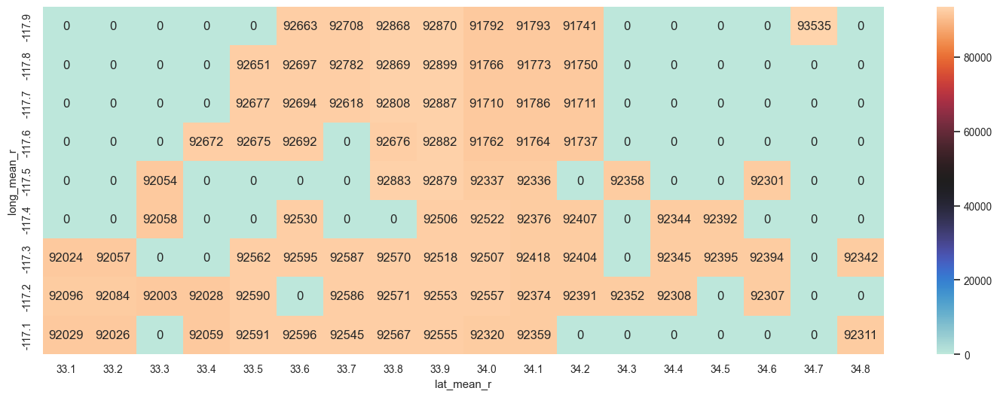

In [75]:
geo_cond = (zip_df['lat_mean_r'] > 33) & (zip_df['lat_mean_r'] < 36) & (zip_df['long_mean_r'] < -117) & (zip_df['long_mean_r'] > -118)
plt.figure(figsize=(18, 6))
sns.heatmap(zip_df[geo_cond].pivot(index='long_mean_r', columns='lat_mean_r', values='zip_code').fillna(0), 
            annot=True, annot_kws={"size":12}, fmt="g", cmap='icefire', cbar=True)

On a smaller scale zip codes do not seem to follow any obvious pattern. Let's double check and look at the raw pivoted data without rounding and aggregation.

In [76]:
geo_cond = (df['lat_mean'] > 34) & (df['lat_mean'] < 34.3) & (df['long_mean'] < -117) & (df['long_mean'] > -117.3)
df[geo_cond][['zip_code', 'lat_mean', 'long_mean']].pivot(index='long_mean', columns='lat_mean', values='zip_code').fillna(0)

lat_mean,34.031861,34.032098,34.041247,34.051292,34.054132,34.063346,34.065789,34.073675,34.078395,34.103942,34.104063,34.105959,34.138818,34.178662,34.237062,34.239255,34.246852,34.256231,34.256970
long_mean,,,,,,,,,,,,,,,,,,,
-117.293059,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,92418.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
-117.292720,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,92325.0,0.0,0.0
-117.292326,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,92401.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
-117.288652,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,92410.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
-117.284279,0.0,0.0,0.0,0.0,0.0,92403.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
-117.278659,92324.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
-117.263409,0.0,0.0,0.0,92350.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
-117.258272,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,92408.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
-117.253112,0.0,0.0,0.0,0.0,92354.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Indeed, even though change of zipcodes on a larger scale is tied to change in longitude, smaller scale dynamics is not so clear. To reconfirm the relation of zipcodes to latitude and longitude, let's plot zipcodes against logitude and latitude explicitly.

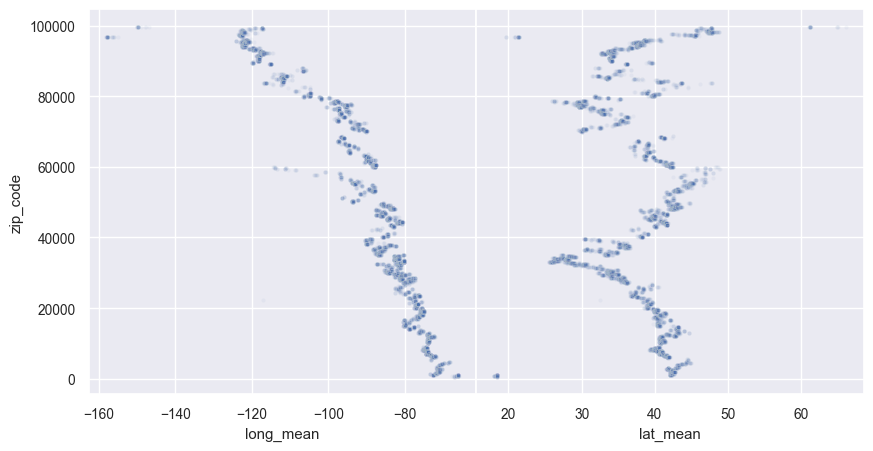

In [77]:
fig, ax = plt.subplots(1, 2, figsize=[10,5], sharey=True)
sns.scatterplot(df, x=df.sort_values('long_mean')['long_mean'], y=df.sort_values('long_mean')['zip_code'], marker='.', alpha=.05, ax=ax[0])
sns.scatterplot(df, x=df.sort_values('lat_mean')['lat_mean'], y=df.sort_values('lat_mean')['zip_code'], marker='.', alpha=.05, ax=ax[1])
fig.subplots_adjust(hspace=0, wspace=0)

Indeed we see the confirmation of the previous observation, zip codes change almost monotonously with change in longitude. Relationship of zip codes with lattitude, however, is more complex.

There are several ways zipcodes could be coded for use in ML tasks. One way is to treat them as categorical features encode them accordingly. In the case of our dataset though, there are too many unique values in this feature. Given that there are already latitude and longitude columns in the dataset, it makes sense to replace zipcodes with mean long. and lat. for a given zipcode. Additionally, as discussed above, area of each area could be added, along with density of panels for the given zip code. To retain part of information provided by the feature, for good measure, approximation of zipcode by first 2 digits could also be added. #TODO

<a name='5'></a>
# States

Let's now look at the states column.

In [78]:
print(f"Sample: {sorted(df['state'].unique())[:10]}\nTotal len: {len(df['state'].unique())}")

Sample: ['Aguadilla', 'Alabama', 'Alaska', 'Arecibo', 'Arizona', 'Arkansas', 'Baja California', 'Bayamón', 'California', 'Canóvanas']
Total len: 69


Interestingly, there are more than 50 states in data. Apparently, some of the states are non-US. Let's look at those and check if separating them from the rest by an aditional feature makes sense.

In [281]:
states_accro_replacement = pd.read_csv('states_accro_mapping.csv', sep=';').set_index('Accro').to_dict()['State']
states_to_zips_df = pd.read_csv('zip_code_database.csv')
states_to_zips_df.loc[:, 'state'] = states_to_zips_df[['state']].replace(states_accro_replacement)


US sample: ['District of Columbia' 'Delaware' 'Montana' 'Rhode Island'
 'New Hampshire' 'Wyoming' 'Alaska' 'South Dakota' 'Vermont'
 'North Dakota']
Non US sample: ['Ponce' 'Guaynabo' 'San Juan' 'Cataño' 'Toa Baja' 'Toa Alta' 'Bayamón'
 'Trujillo Alto' 'Carolina' 'Aguadilla']


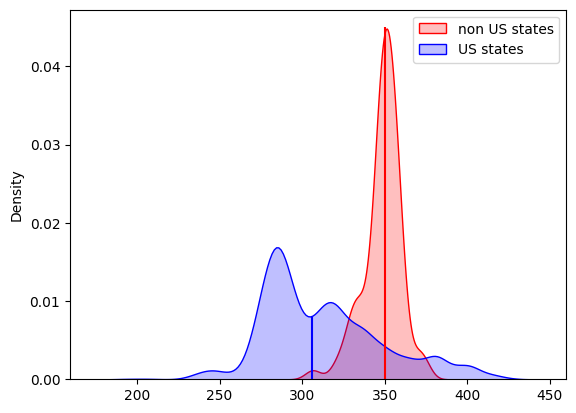

In [295]:
non_us_states = df[~df['state'].isin(states_to_zips_df['state'].unique())]['state'].unique()
us_states = df[df['state'].isin(states_to_zips_df['state'].unique())]['state'].unique()
print(f'US sample: {us_states[:10]}')
print(f'Non US sample: {non_us_states[:10]}')

non_us_kwh_norm = df[df['state'].isin(non_us_states)]['potential_kwh_total'] / df[df['state'].isin(non_us_states)]['number_of_panels_total']
us_kwh_norm = df[df['state'].isin(us_states)]['potential_kwh_total'] / df[df['state'].isin(us_states)]['number_of_panels_total']

fig, ax = plt.subplots(1)
sns.kdeplot(non_us_kwh_norm, ax=ax, color='red', fill=True, label='non US states'); plt.vlines(x=non_us_kwh_norm.median(), ymax=0.045, ymin=0, color='r')
sns.kdeplot(us_kwh_norm, ax=ax, color='blue', fill=True, label='US states'); plt.vlines(x=us_kwh_norm.median(), ymax=0.008, ymin=0, color='b')
plt.legend();

As evident, normalised by number of panels median value of the label differs by about 15%, so it makes sense to add aditional feature to mark US and non-US states. This will be added at ETL phase as a simple categorical feature. #TODO

Let's now verify that states and zipcodes data is consistent, i.e. that zipcodes associated with certain states do actually belong there. For this we will merge the reference dataset to the one in question by state and zip code and check that the number of rows does not change.

In [730]:
merged = df[df['state'].isin(us_states)].merge(states_to_zips_df, 
                                               how='inner', 
                                               left_on=['state', 'zip_code'], 
                                               right_on=['state', 'zip'])
merged.shape[0] == df[df['state'].isin(us_states)].shape[0]

True

We see that merge is successful, so every state - zip code pair in the reference dataset was mapped to corresponding pair in the dataset in question. Which means that all zip codes in the dataset being explored are correctly assigned to states.

Now let's verify that latitude and longitude data given is also consistent with mapped states. First we'll calculate aproximate centroids for each state and longest distance between given zipcodes within one state. We will use fraction of the latter as an approximate radious of the state. All distances between panels and centroids should be less than this approximate radius.

In [633]:
def find_state_dim_centr(tx_df):
    if (tx_df.empty) | (tx_df.shape[0]<2): return pd.Series({'state_size': 0, 'centr_lat': 0, 'centr_long': 0})
    edge_points = tx_df.loc[
        (tx_df['latitude']==max(tx_df['latitude'])) | (tx_df['latitude']==min(tx_df['latitude'])) |
        (tx_df['longitude']==max(tx_df['longitude'])) | (tx_df['longitude']==min(tx_df['longitude'])) , :    
    ][['latitude', 'longitude']]
    if (edge_points.empty) | (edge_points.shape[0]<2): return pd.Series({'state_size': 0, 'centr_lat': 0, 'centr_long': 0})
    state_size = 0
    for dimension in ['latitude', 'longitude']:
        dim_points = edge_points.loc[(edge_points[dimension]==max(edge_points[dimension])) | 
                                    (edge_points[dimension]==min(edge_points[dimension])), :].drop_duplicates(dimension).values
        state_size = max([state_size, np.linalg.norm(dim_points[0] - dim_points[1])])
    return pd.Series({'state_size': .75 * state_size,                                # approximate radious
                      'centr_lat': tx_df['latitude'].sum() / tx_df.shape[0],         # centroid latitude
                      'centr_long': tx_df['longitude'].sum() / tx_df.shape[0]})      # centroid longitude

We are using the function built above to calculate centroids and draw them on the map below for sanity check. To draw points on the map we'll use separate geoPandas library and a separate file with map data.

In [ ]:
#reading global map data
gpd_data = gpd.read_file('/Users/igorchebuniaev/Downloads/ne_10m_admin_1_states_provinces/ne_10m_admin_1_states_provinces.shp')

/Users/igorchebuniaev/.local/share/virtualenvs/RL_in_ksp--361CVkw/lib/python3.9/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


(23.0, 50.0)

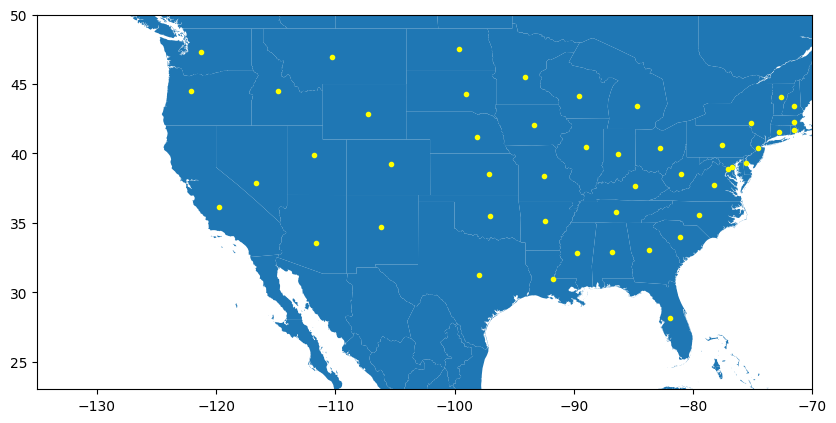

In [635]:
ave_df = states_to_zips_df[['state', 'latitude', 'longitude']][(states_to_zips_df['latitude']!=0)].dropna().groupby('state').apply(find_state_dim_centr)

crs = {'init':'EPSG:4326'}
geometry = [Point(xy) for xy in zip(ave_df['centr_long'], ave_df['centr_lat'])]
ave_df_geo_df = gpd.GeoDataFrame(ave_df, crs = crs, geometry = geometry)

fig, ax = plt.subplots(figsize=[10, 7])
gpd_data.plot(ax=ax)
ave_df_geo_df.plot(ax=ax, marker='.', alpha=1, color='yellow')
ax.set_xlim(-135, -70); ax.set_ylim(23, 50) # adjusting axis limits to fit all data tightly

We see that centroids in most cases are built correclty, let's now calculate distance between cetroids and mean coordinates for each panel row and find ratio of that distance to the calculated state size. We expect the ratios to be less than 1.

In [728]:
df_with_ref = df.merge(ave_df[ave_df['state_size']>0].reset_index(), how='left', left_on=['state'], right_on=['state'])
df_with_ref.loc[:, 'lat_mean'] = (df_with_ref['lat_max'] + df_with_ref['lat_min']) / 2
df_with_ref.loc[:, 'long_mean'] = (df_with_ref['long_max'] + df_with_ref['long_min']) / 2
df_with_ref.loc[:, 'distance_to_centr'] = np.sqrt((df_with_ref['lat_mean'] - df_with_ref['centr_lat'])**2 + (df_with_ref['long_mean'] - df_with_ref['centr_long'])**2)
df_with_ref.loc[:, 'dist_to_centr_rel_to_state_size'] = df_with_ref['distance_to_centr'] / df_with_ref['state_size']

#let's now see what the maximum values of ratios are 
df_with_ref[['state', 'dist_to_centr_rel_to_state_size']].sort_values('dist_to_centr_rel_to_state_size', ascending=False)[:10]

,state,dist_to_centr_rel_to_state_size
3211,Florida,0.942713
3114,Florida,0.925627
2969,Florida,0.923668
3105,Florida,0.918798
3261,Florida,0.918654
3336,Florida,0.916718
3382,Florida,0.915041
3582,Florida,0.908763
2988,Florida,0.908650
3561,Florida,0.907983


We see that maximum ratios of distance of panels to state centroids to approximate radious of respective state are less than 1. This means that even the furthest from centroids points are within the same state. Just to double check, let's draw those top points on the map, conviniently they all are within the same state.

Number of points: 14


/Users/igorchebuniaev/.local/share/virtualenvs/RL_in_ksp--361CVkw/lib/python3.9/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


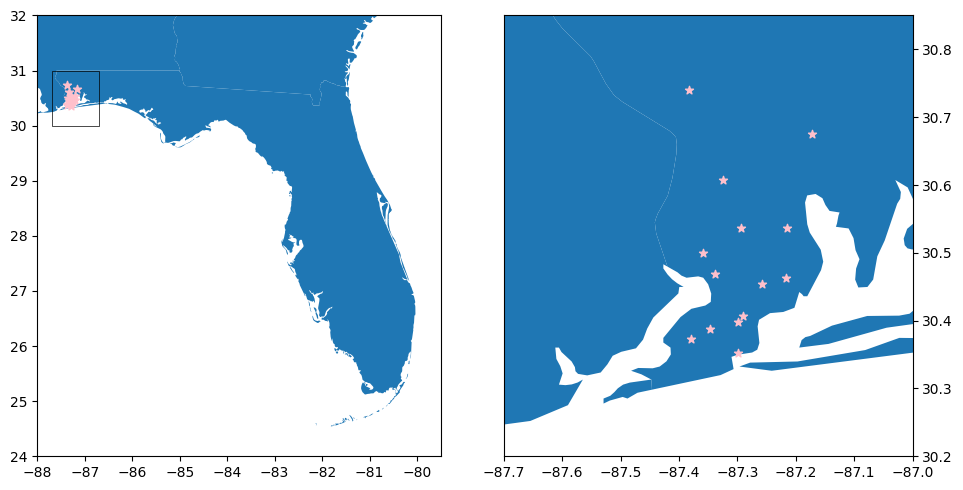

In [729]:
fl_df = df_with_ref[ (df_with_ref['dist_to_centr_rel_to_state_size']>=.9)]
print('Number of points:', fl_df.shape[0])
crs = {'init':'EPSG:4326'}
geometry = [Point(xy) for xy in zip(fl_df['long_mean'], fl_df['lat_mean'])]
fl_df_geo = gpd.GeoDataFrame(fl_df, crs = crs, geometry = geometry)

fig, ax = plt.subplots(1, 2, figsize=[10, 5])
gpd_data.plot(ax=ax[0])
fl_df_geo.plot(ax=ax[0], marker='*', color='pink')
ax[0].set_xlim(-88, -79.5); ax[0].set_ylim(24, 32) # adjusting axis limits to fit all data tightly
ax[0].add_patch(Rectangle((-87.7, 30),1,1,linewidth=.5, edgecolor='black',facecolor='none'))

gpd_data.plot(ax=ax[1])
fl_df_geo.plot(ax=ax[1], marker='*', color='pink')
ax[1].set_xlim(-87.7, -87); ax[1].set_ylim(30.2, 30.85) # adjusting axis limits to fit all data tightly
ax[1].yaxis.tick_right()
plt.tight_layout()


We see on the map, that indeed all 14 points furthest from respective state centroids are within the same state.

Let's now take a broader view and see where all the panels are on the map.

/Users/igorchebuniaev/.local/share/virtualenvs/RL_in_ksp--361CVkw/lib/python3.9/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


(15.0, 63.0)

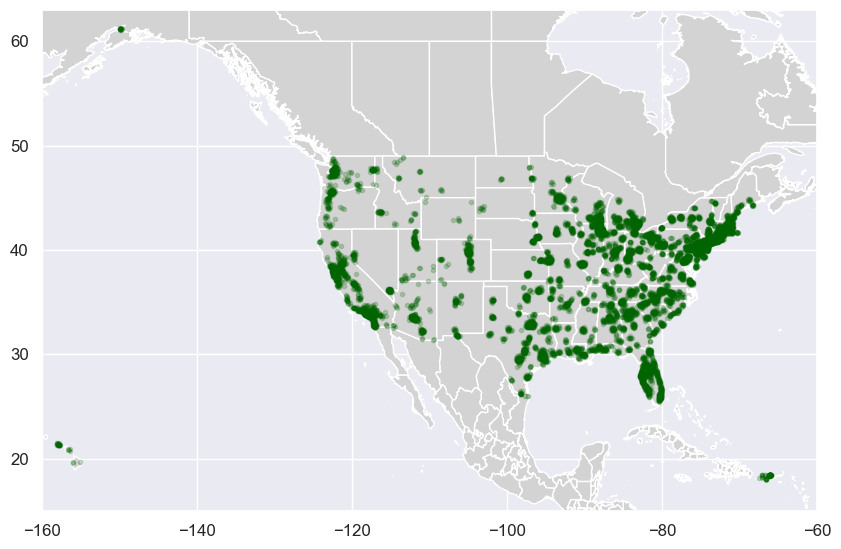

In [500]:
crs = {'init':'EPSG:4326'}
geometry = [Point(xy) for xy in zip(df['long'], df['lat'])]
geo_df = gpd.GeoDataFrame(df, crs = crs, geometry = geometry)

fig, ax = plt.subplots(figsize=[10, 7])
gpd_data.plot(ax=ax, color='lightgrey')
geo_df.plot(ax=ax, marker='.', alpha=.2, color='darkgreen')
ax.set_xlim(-160, -60); ax.set_ylim(15, 63) # adjusting axis limits to fit all data tightly

Indeed we see that some data points are outside of continental USA. We seen that previouse when we checked if all states in the data are in the USA. Majority of datapoints seem to be concentrated along the coasts of the USA. Let's examine distribution of panels across states closer.

In [317]:
crs = {'init':'EPSG:4326'}
geometry = [Point(xy) for xy in zip(states_df['long'], states_df['lat'])]
geo_states_df = gpd.GeoDataFrame(states_df, crs = crs, geometry = geometry)

/Users/igorchebuniaev/.local/share/virtualenvs/RL_in_ksp--361CVkw/lib/python3.9/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


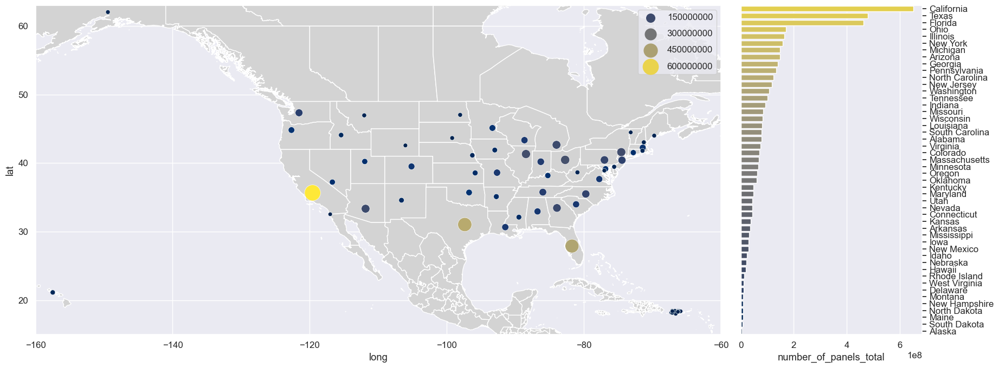

In [499]:
fig, ax = plt.subplots(1, 2, figsize=[19, 7], gridspec_kw={'width_ratios': [4, 1]})
sns.set(font_scale=1.1)

gpd_data.plot(ax=ax[0], color='lightgrey')
sns.scatterplot(data=geo_states_df, y='lat', x='long', size='number_of_panels_total', hue='number_of_panels_total', sizes=(30, 450), palette='cividis', ax=ax[0])
sns.barplot(data=states_df[states_df['number_of_panels_total']>states_df['number_of_panels_total'].quantile(.3)],
            y='state', x='number_of_panels_total', log=False, palette='cividis_r', ax=ax[1])

ax[0].set_xlim(-160, -60); ax[0].set_ylim(15, 63); ax[0].legend(labelspacing=.9)
ax[1].yaxis.tick_right(); ax[1].set_ylabel(None)

fig.tight_layout()
fig.subplots_adjust(hspace=0, wspace=0)


As we see 3 states are clear leaders in the number of panels. So, because target feature through the proxy varies a lot depending on state, state feature should be important for the prediction model. Hence, we need to encode this categorical feature somehow. Again, we wouldn't want to add over 50 columns to the dataset for a single feature, so encoding them as coordinates of state centroids would be preferable. Additionally we could add larger geographical regions of USA, such as mid-West, north-West etc. #TODO

At this we finalise the EDA phase and move to ETL where we will perform all the actions taged by #TODO throughout this file.